# DataX: Urban Water Consumption in China

# Initialization

Load data; drop rows and columns with excessive NaN values; 

### Load data, pre-processing, imputation of missing values

In [2]:
#Import modules
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
# Read in data with outliers removed. 
df = pd.read_excel('OutliersRemoved2.xlsx')

In [4]:
# What is the shape of the loaded data? 
df.shape

(7524, 91)

In [5]:
#Drop rows and columns with too many NaNs
df = df.dropna(thresh=5000, axis='columns') #Drop columns that have at least 3000 non-NaN values
df = df.dropna(how='any', thresh=40) # Rows/observations should have at least 30 non-NaN values 

#Shape of the refined data
df.shape

(5667, 53)

In [6]:
#Check: how many remaining null values are there for each feature?
df.isnull().sum()

#Show the features with null values as a percent of the total values
df.isnull().sum()/len(df)

# Table below shows acceptable values for missing data (feature with highest missing data is ~15%)
# Imputing NaN values with the mean average of each column is more reliable with less missing data. 

City/province name (CN)                                                             0.000000
City/province name (EN)                                                             0.000000
Province                                                                            0.000000
Province Key                                                                        0.000000
Region                                                                              0.000000
Region Key                                                                          0.000000
Year                                                                                0.000000
1.1. Total production capacity (10,000 cubic metres/day)                            0.008647
1.3. Number of plants (units)                                                       0.026293
2.1. Total water supply volume / year (10,000 cubic metres/year)                    0.008470
2.2. Average supply per day (10,000 cubic metres/day)                 

In [7]:
# Create a dataframe with the NaN values filled in with the mean of column features
df_og = df.fillna(df.mean())    

In [8]:
SummaryStats = df_og.describe()
SummaryStats

,Province Key,Region Key,Year,"1.1. Total production capacity (10,000 cubic metres/day)",1.3. Number of plants (units),"2.1. Total water supply volume / year (10,000 cubic metres/year)","2.2. Average supply per day (10,000 cubic metres/day)","2.3. Maximum supplied in a day (10,000 cubic metres/day)","3.1. Total Volume of water sold (10,000 cubic metres/year)","3.2. Of which Domestic/residential water (10,000 cubic metres/year)",...,23. Unit water sales cost (yuan / thousand m3),"24. Total wages (10,000 yuan)",25.1. Total employees (persons),25.2. Of which On-duty workers,25.4. Of which professional and technical personnel,27.1. Residential drinking water Current price or standard (yuan/cubic meter),28.1. Administrative water Current price or standard (yuan/cubic meter),29.1. Industrial water Current price or standard (yuan/cubic meter),30.1. Business services water Current price or standard (yuan/cubic meter),32.1. Unit average water Current price or standard (yuan/cubic meter)
count,5667.000000,5667.000000,5667.000000,5667.000000,5667.000000,5667.000000,5667.000000,5667.000000,5667.000000,5667.000000,...,5667.000000,5667.000000,5667.000000,5667.000000,5667.000000,5667.000000,5667.000000,5667.000000,5667.000000,5667.000000
mean,12.053467,3.179989,2006.946533,21.050936,2.781062,4280.073542,11.967341,16.026174,3272.730059,1462.754944,...,1758.757136,1122.520029,476.781940,447.244159,92.968238,1.617299,2.208173,2.248701,2.896229,1.852053
std,6.480833,1.341352,3.744364,30.577147,1.972142,6888.027466,19.306636,35.240828,5329.454105,2212.482597,...,990.343710,1768.085921,578.195083,563.059764,104.861516,0.594437,1.013837,1.060159,2.096005,0.875763
min,1.000000,1.000000,2001.000000,0.300000,0.200000,0.900000,0.002466,0.050000,3.500000,12.760000,...,0.140000,3.820000,-161.000000,0.117000,1.000000,0.350000,0.540000,0.600000,0.680000,0.250000
25%,6.000000,2.000000,2004.000000,4.500000,1.000000,804.500000,2.276986,2.870000,560.000000,310.000000,...,1125.120000,245.845000,165.000000,150.000000,32.000000,1.200000,1.430000,1.450000,1.890000,1.300000
50%,12.000000,3.000000,2007.000000,10.000000,2.000000,1828.000000,5.140000,6.500000,1345.000000,724.000000,...,1601.000000,516.000000,283.000000,261.000000,64.000000,1.500000,2.050000,2.000000,2.580000,1.770000
75%,16.000000,4.000000,2010.000000,22.500000,3.000000,4350.340000,12.000000,16.026174,3272.730059,1565.000000,...,2140.000000,1122.520029,536.000000,495.000000,99.000000,1.950000,2.700000,2.840000,3.500000,2.110000
max,29.000000,6.000000,2013.000000,212.700000,24.000000,46210.000000,134.440000,1237.520000,35631.680000,17444.000000,...,12318.000000,16274.700000,5624.000000,5275.000000,978.000000,3.900000,7.850000,10.600000,120.000000,27.100000


# Background on China's water access trends compared to global status quo

In [8]:
# Initialization, import modules, read in data
import pandas as pd
import numpy as np
import plotly.plotly as py
import plotly.graph_objs as go 
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
%matplotlib inline
init_notebook_mode(connected=True) 
cf.go_offline()
df = pd.read_excel('water_global.xlsx', index_col='COUNTRY') #World Bank data on global access to improved water sources
df.head()


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


,CODE,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
COUNTRY,,,,,,,,,,,,,,,,,,,,,
Aruba,ABW,91.0,91.3,91.6,91.9,92.3,92.6,92.9,93.2,93.6,...,96.2,96.5,96.8,97.1,97.4,97.8,98.1,98.1,98.1,98.1
Afghanistan,AFG,NaN,21.2,21.3,21.4,21.4,21.5,23.3,25.0,26.8,...,40.8,42.6,44.4,46.2,48.0,49.8,51.6,53.4,55.2,55.3
Angola,AGO,45.7,45.8,45.8,45.9,46.3,46.1,45.9,45.8,45.7,...,46.2,46.4,46.6,46.9,47.1,47.5,47.8,48.2,48.6,49.0
Albania,ALB,NaN,NaN,NaN,NaN,95.7,95.7,95.7,95.8,95.8,...,96.0,95.9,95.8,95.7,95.6,95.5,95.4,95.2,95.1,95.1
Andorra,AND,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0


In [9]:
# Clean data
df = df.dropna(how='any')

In [10]:
# Chloropleth mapping
data = dict(
        type = 'choropleth',
        locations = df['CODE'],
        z = df[1990],
        text = df['CODE'],
        colorbar = {'title' : '% of Population'},
      ) 

In [11]:
# Chloropleth mapping
layout = dict(
    title = 'Improved water source acess (% of population with access), 1990',
    geo = dict(
        showframe = False,
        projection = {'type':'Mercator'}
    )
)

### According to World Bank data, China has made great strides in providing access to improved water sources between 1990 and 2015:

In [12]:
choromap = go.Figure(data = [data],layout = layout)
iplot(choromap)

In [13]:
data = dict(
        type = 'choropleth',
        locations = df['CODE'],
        z = df[2015],
        text = df['CODE'],
        colorbar = {'title' : '% of Population'},
      ) 

In [14]:
layout = dict(
    title = 'Improved water source access (% of population with access), 2015',
    geo = dict(
        showframe = False,
        projection = {'type':'Mercator'}
    )
)

In [15]:
choromap = go.Figure(data = [data],layout = layout)
iplot(choromap)

### China has almost caught up with industrialized nations like the US

In [16]:
df1 = pd.read_excel('timeseries1.xlsx',index_col='YEAR')
df1 = df1.dropna(how='all')
df1[['United States','China', 'India', 'Angola', 'Philippines', 'Ukraine']].iplot(kind='scatter', title = 'Improved water source access (% of population with access)')

### However, China's urban population has alos grown tremendously, which has put strains on management of urban water supply

In [17]:
df2 = pd.read_excel('ChinaPopulation.xlsx', index_col = 'Year')
df2.iplot(kind='spread', title = 'Urban and Rural Population Trends in China')

# Visual exploratory data analysis

Goals: Understand relationships in the data

### Pairplots
Scatter plots showing the relationship between selected features

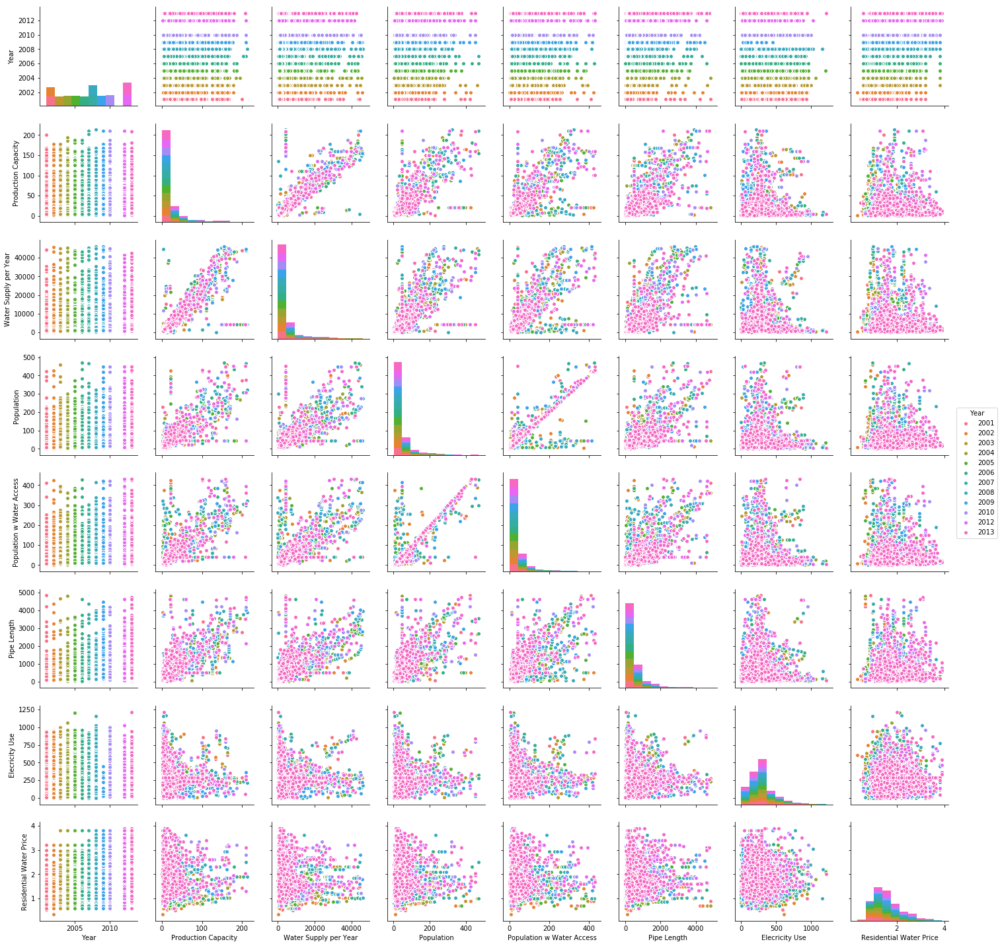

In [18]:
# Pairplots show the relationship between selected features (change selected features as required)

# Chosen features for this pairplot: 
combo = ['Year',
         '1.1. Total production capacity (10,000 cubic metres/day)',
         '2.1. Total water supply volume / year (10,000 cubic metres/year)',
         '5.2. Total city population (10,000s)',
         '5.3. Total city population with water access (10,000s)',
         '8.1. Total pipe length (km)',
         '17.2. Electricity use for water production (1,000 kWh/1,000 cubic metre)', 
         '27.1. Residential drinking water Current price or standard (yuan/cubic meter)']

df=df_og[combo].copy()
df.dropna(axis=0,how='any',inplace=True) #redundant now since means have been imputed, but keep in case other data is loaded
df.reset_index(drop=True,inplace=True)
df.columns=['Year','Production Capacity','Water Supply per Year','Population','Population w Water Access','Pipe Length'
           ,'Elecricity Use','Residential Water Price']
df

sns.pairplot(data=df,hue='Year', kind='scatter',diag_kind='hist')
plt.show()

### Boxplots, Swarmplots 

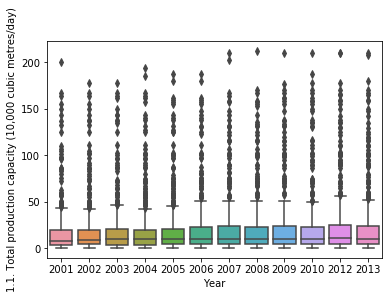

In [19]:
# Boxplot
sns.boxplot(x='Year', y='1.1. Total production capacity (10,000 cubic metres/day)', data= df_og,)
sns.set_context("notebook")
plt.show()

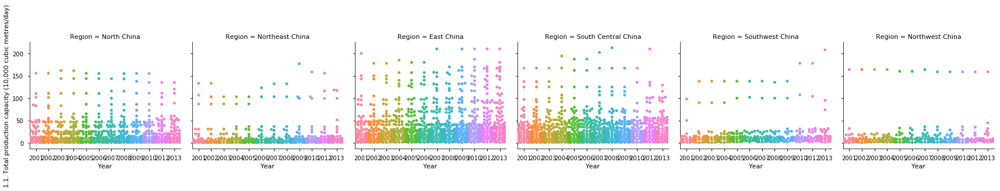

In [20]:
sns.factorplot(x="Year", y = '1.1. Total production capacity (10,000 cubic metres/day)', 
               col="Region", data=df_og, kind="swarm")

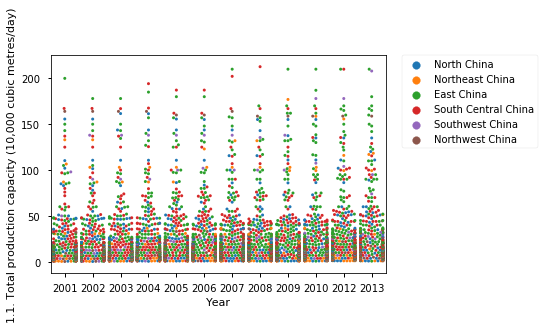

In [21]:
# Swarmplot
sns.swarmplot(x='Year', y='1.1. Total production capacity (10,000 cubic metres/day)', 
              data= df_og, hue = 'Region', size =3)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
sns.set_context("notebook")
plt.show()


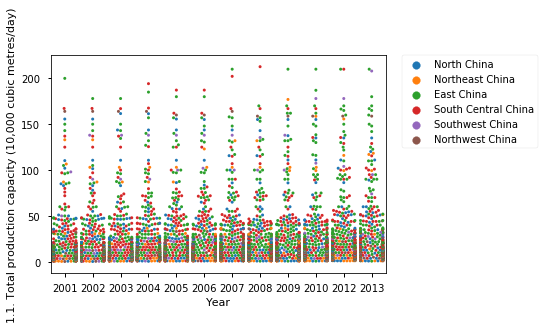

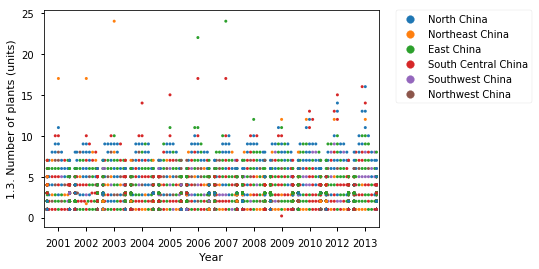

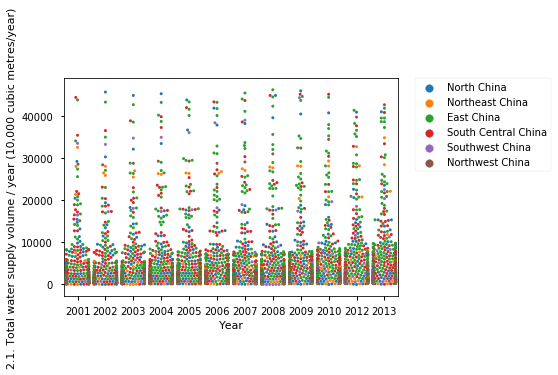

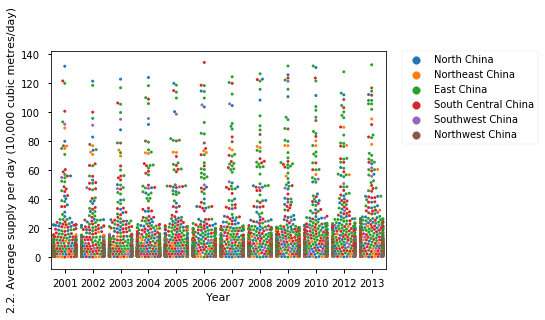

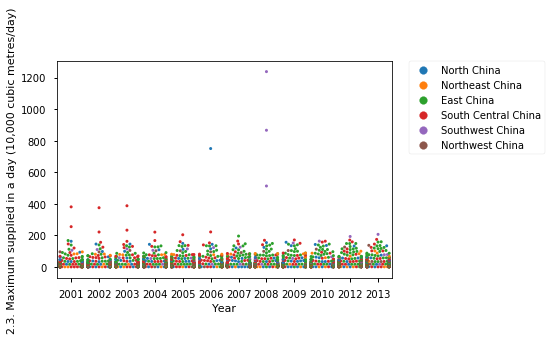

...

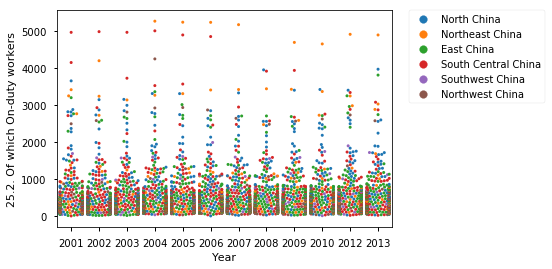

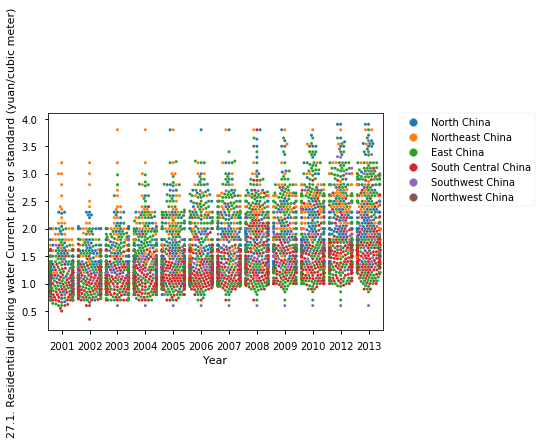

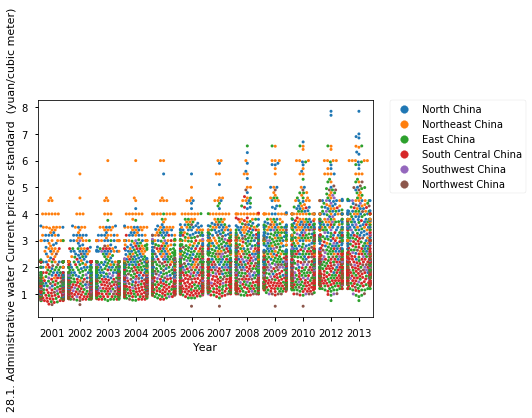

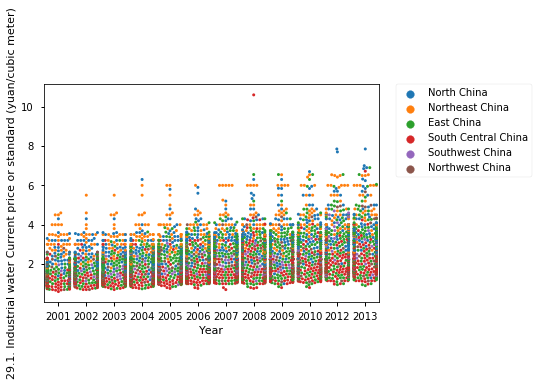

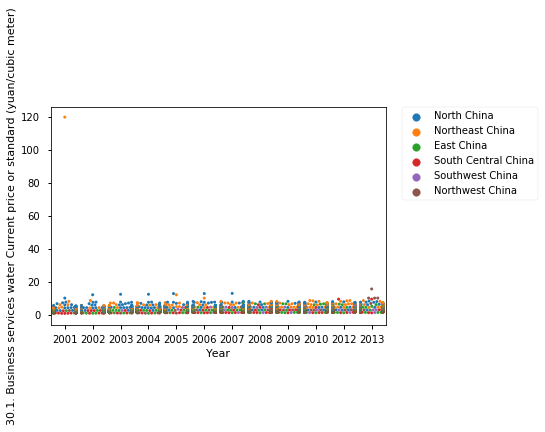

In [22]:
Y = ['1.1. Total production capacity (10,000 cubic metres/day)',
     '1.3. Number of plants (units)',
       '2.1. Total water supply volume / year (10,000 cubic metres/year)',
       '2.2. Average supply per day (10,000 cubic metres/day)',
       '2.3. Maximum supplied in a day (10,000 cubic metres/day)',
       '3.1. Total Volume of water sold (10,000 cubic metres/year)',
       '3.2. Of which Domestic/residential water (10,000 cubic metres/year)',
       '4. Water sold / water produced (%)',
       '5.1. Coverage rate of urban water supply (%)',
       '5.2. Total city population (10,000s)',
       '5.3. Total city population with water access (10,000s)',
       '6.1. Average water use for all purposes (L/person*day)',
       '6.2. Average water use for residential/household/living purposes (L/person*day)',
       '8.1. Total pipe length (km)', '8.3. Of which are supplying water (km)',
       '8.4. of which how much length is for piping 75mm diameter and above (km)',
       '9. Loss and leakage volume (10,000 cubic metres)',
       '10. Loss and leakage rate (%)',
       '13.1. Total number of water meters (units)',
       '13.2. Of which Domestic/residential',
       '14.1. Overall rate of water that meets standard (%)',
       '14.2. turbidity rate meeting standard (%)',
       '14.6. Bacterial contamination rate meeting standards (%)',
       '14.7. Total coliform contamination rate meeting standard (%)',
       '14.8. Oxygen demand (CODMn) meeting standard rate (%)',
       '15.1. Rate at which pressure in water distribution system meets the standard (%)',
       '17.1. Total electricity use (10,000 kWh)',
       '20.1. Original value (10,000 yuan)', '20.2. Net worth (10,000 yuan)',
       '21. Sales revenue (10,000 yuan)',
       '23. Unit water sales cost (yuan / thousand m3)',
       '24. Total wages (10,000 yuan)', '25.1. Total employees (persons)',
       '25.2. Of which On-duty workers',
       '27.1. Residential drinking water Current price or standard (yuan/cubic meter)',
       '28.1. Administrative water Current price or standard  (yuan/cubic meter)',
       '29.1. Industrial water Current price or standard (yuan/cubic meter)',
       '30.1. Business services water Current price or standard (yuan/cubic meter)']
x= 'Year'
for y in Y:
    sns.swarmplot(x, y, 
              data= df_og, hue = 'Region', size =3)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    sns.set_context("notebook")
    plt.show()

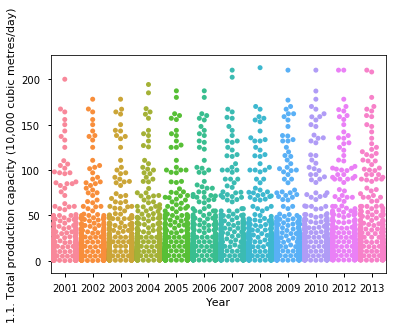

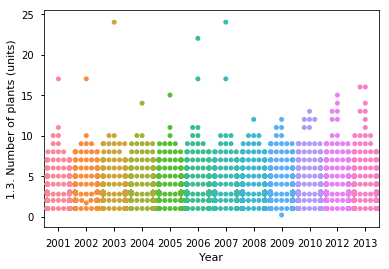

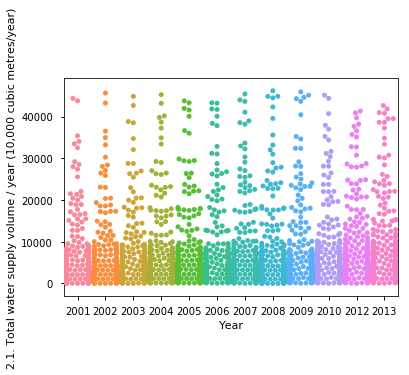

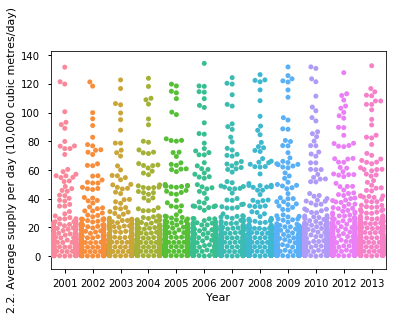

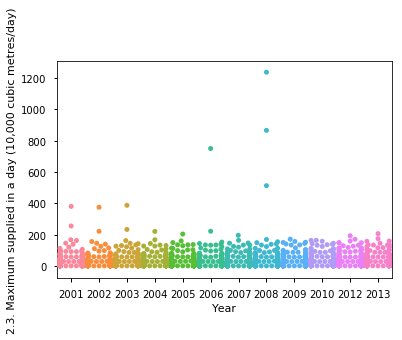

...

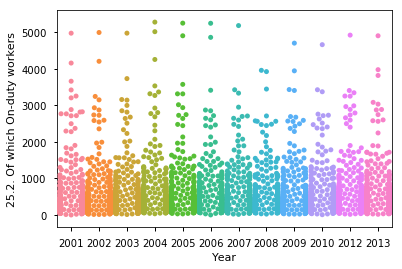

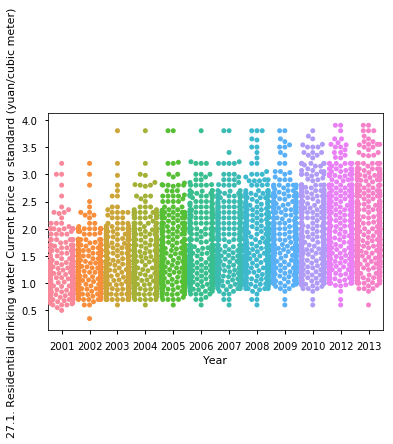

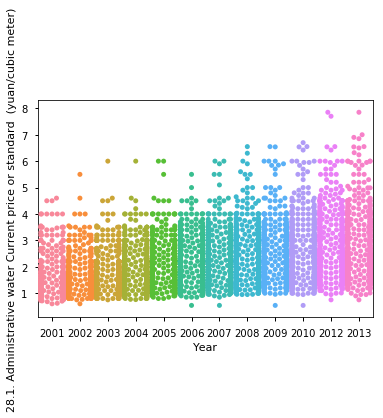

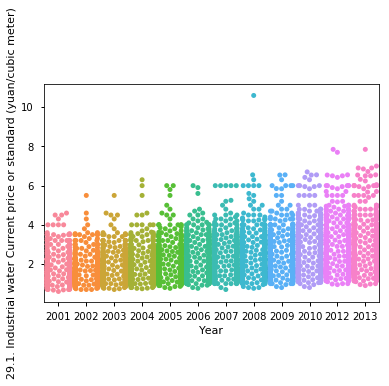

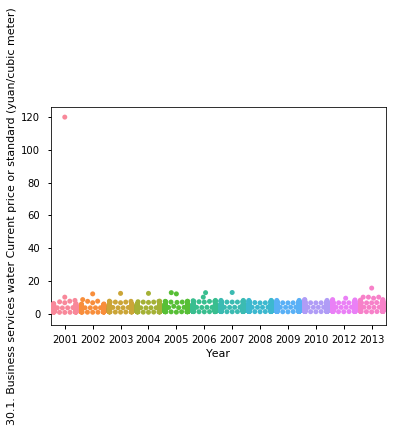

In [23]:
Y = ['1.1. Total production capacity (10,000 cubic metres/day)',
     '1.3. Number of plants (units)',
       '2.1. Total water supply volume / year (10,000 cubic metres/year)',
       '2.2. Average supply per day (10,000 cubic metres/day)',
       '2.3. Maximum supplied in a day (10,000 cubic metres/day)',
       '3.1. Total Volume of water sold (10,000 cubic metres/year)',
       '3.2. Of which Domestic/residential water (10,000 cubic metres/year)',
       '4. Water sold / water produced (%)',
       '5.1. Coverage rate of urban water supply (%)',
       '5.2. Total city population (10,000s)',
       '5.3. Total city population with water access (10,000s)',
       '6.1. Average water use for all purposes (L/person*day)',
       '6.2. Average water use for residential/household/living purposes (L/person*day)',
       '8.1. Total pipe length (km)', '8.3. Of which are supplying water (km)',
       '8.4. of which how much length is for piping 75mm diameter and above (km)',
       '9. Loss and leakage volume (10,000 cubic metres)',
       '10. Loss and leakage rate (%)',
       '13.1. Total number of water meters (units)',
       '13.2. Of which Domestic/residential',
       '14.1. Overall rate of water that meets standard (%)',
       '14.2. turbidity rate meeting standard (%)',
       '14.6. Bacterial contamination rate meeting standards (%)',
       '14.7. Total coliform contamination rate meeting standard (%)',
       '14.8. Oxygen demand (CODMn) meeting standard rate (%)',
       '15.1. Rate at which pressure in water distribution system meets the standard (%)',
       '17.1. Total electricity use (10,000 kWh)',
       '20.1. Original value (10,000 yuan)', '20.2. Net worth (10,000 yuan)',
       '21. Sales revenue (10,000 yuan)',
       '23. Unit water sales cost (yuan / thousand m3)',
       '24. Total wages (10,000 yuan)', '25.1. Total employees (persons)',
       '25.2. Of which On-duty workers',
       '27.1. Residential drinking water Current price or standard (yuan/cubic meter)',
       '28.1. Administrative water Current price or standard  (yuan/cubic meter)',
       '29.1. Industrial water Current price or standard (yuan/cubic meter)',
       '30.1. Business services water Current price or standard (yuan/cubic meter)']
x='Year'
for y in Y:
    sns.swarmplot(x,y, data=df_og)
    plt.show()

### Correlation Heatmap

In [24]:
sns.set(style="white")

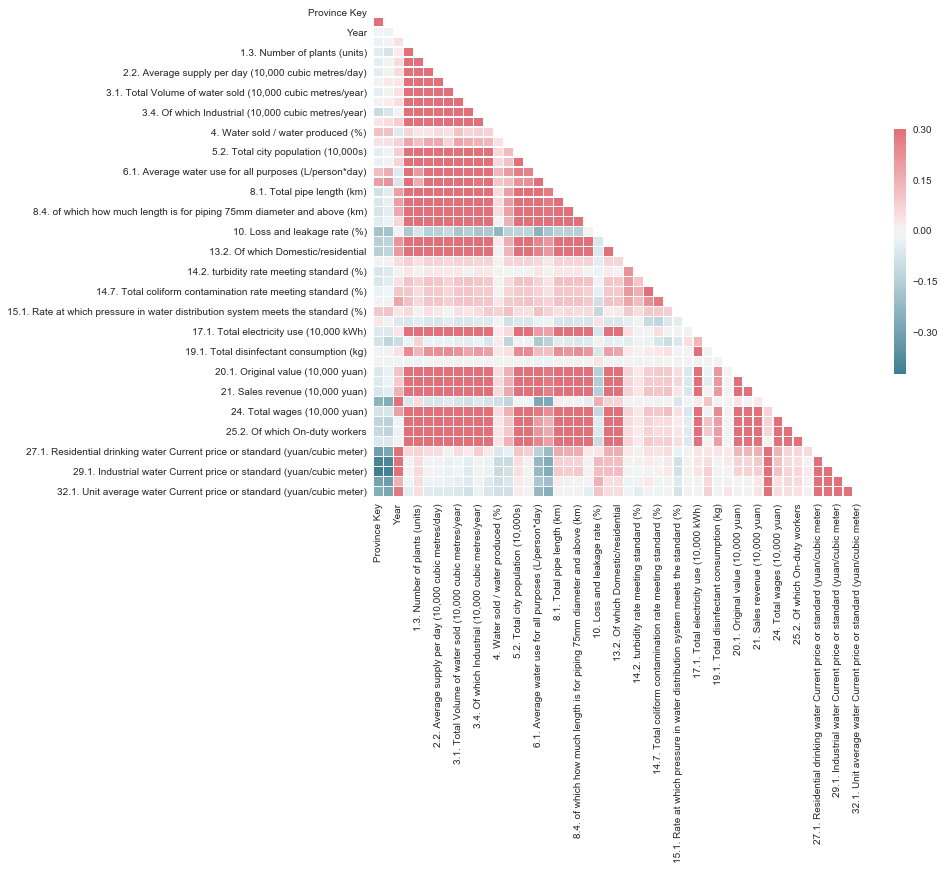

In [25]:
# Compute the correlation matrix of the entire loaded data
corr = df_og.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.show()

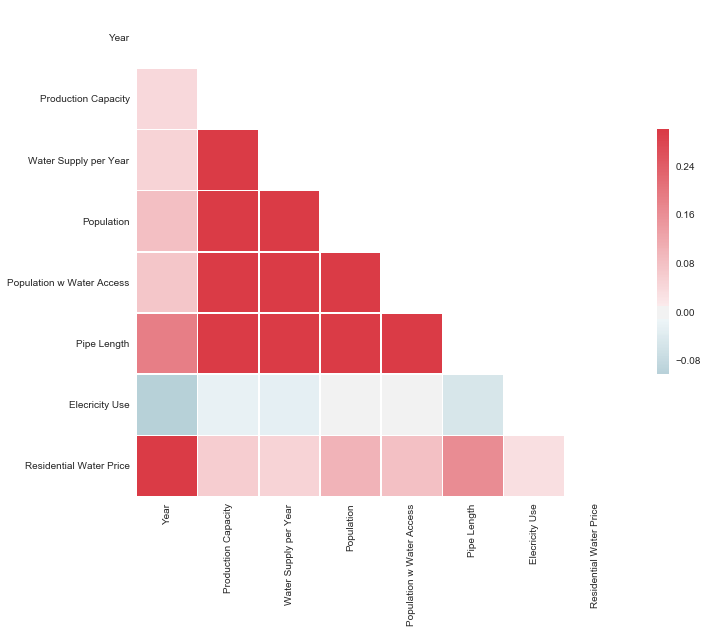

In [26]:
# Compute the correlation matrix of a subset of the data with the features chosen before in section 2.A.
corr = df.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.show()

## Linear Regression - Hypothesis Testing

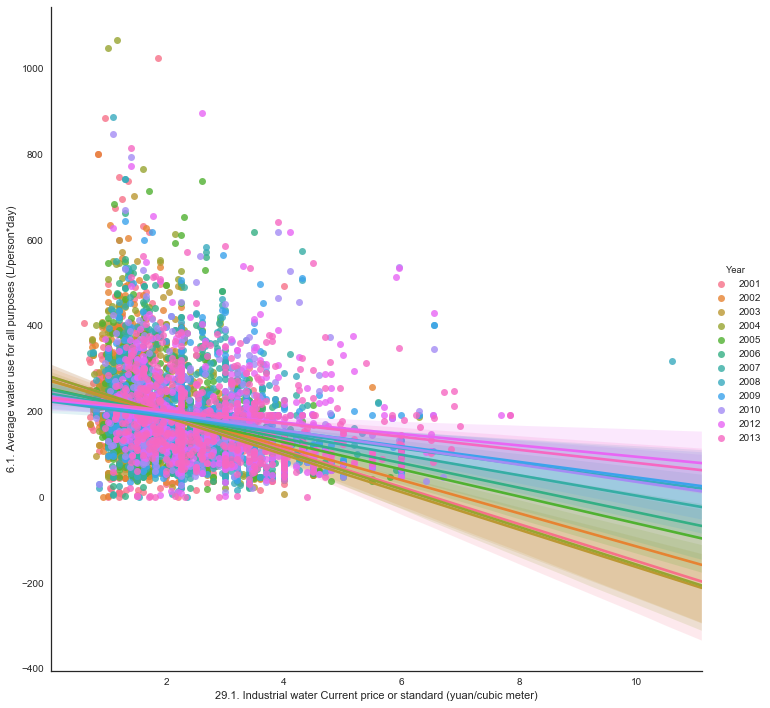

In [27]:
#Higher water price --> less water used
x = '29.1. Industrial water Current price or standard (yuan/cubic meter)'
y = '6.1. Average water use for all purposes (L/person*day)'
sns.lmplot(x,y, data=df_og, hue = 'Year', size = 10)
plt.show()

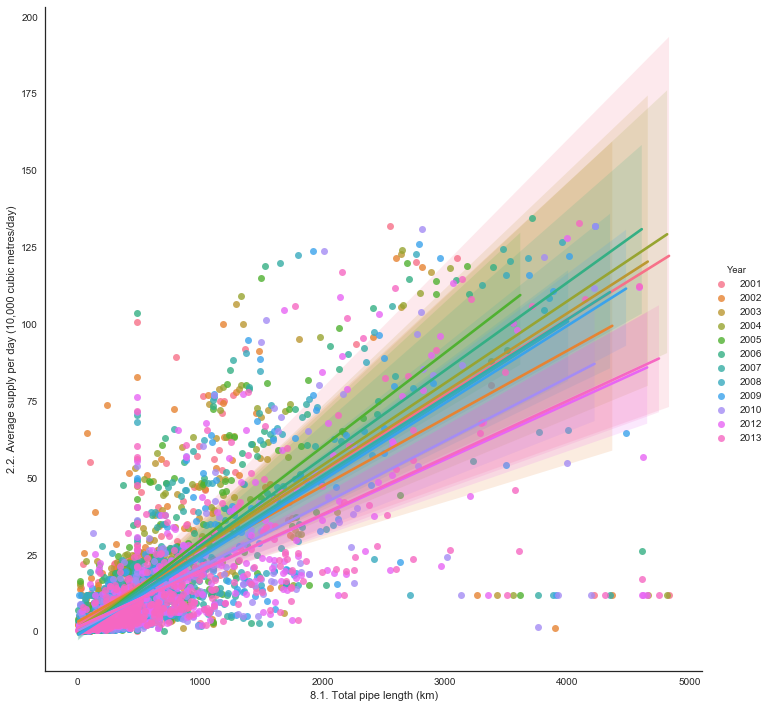

In [28]:
#Longer pipes --> Higher water supply per day
x = '8.1. Total pipe length (km)'
y = '2.2. Average supply per day (10,000 cubic metres/day)'
sns.lmplot(x,y, data=df_og, hue = 'Year', truncate=True, size=10)
plt.show()

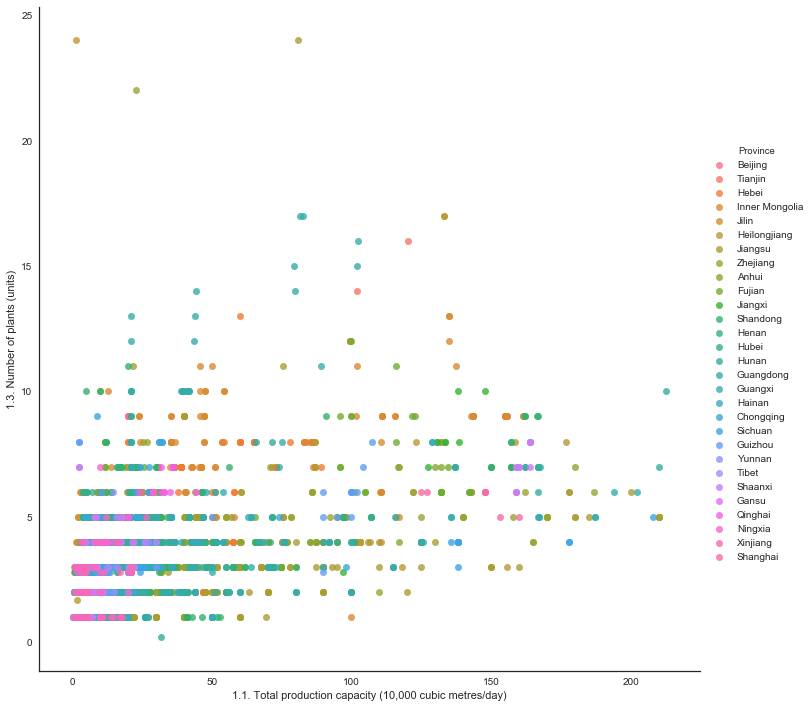

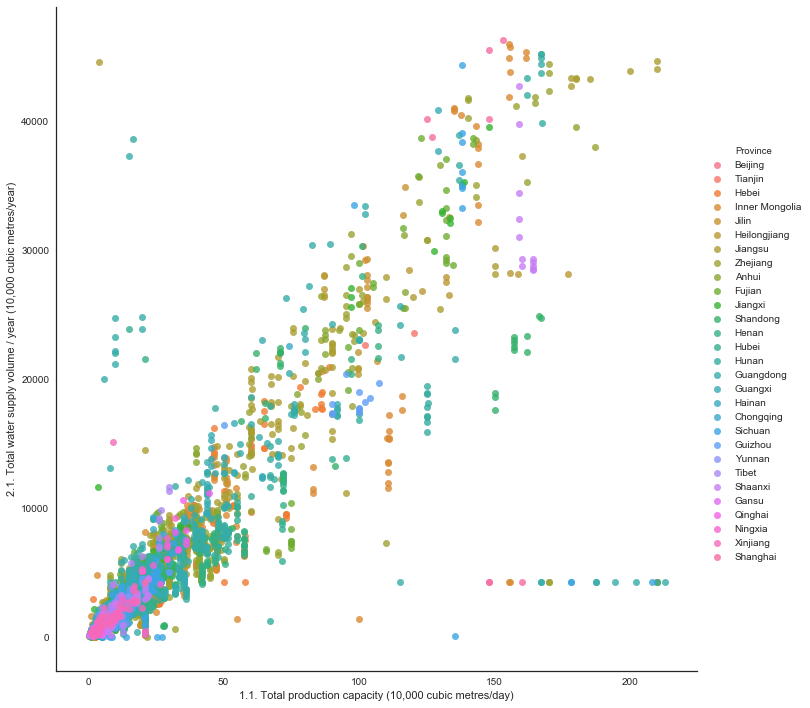

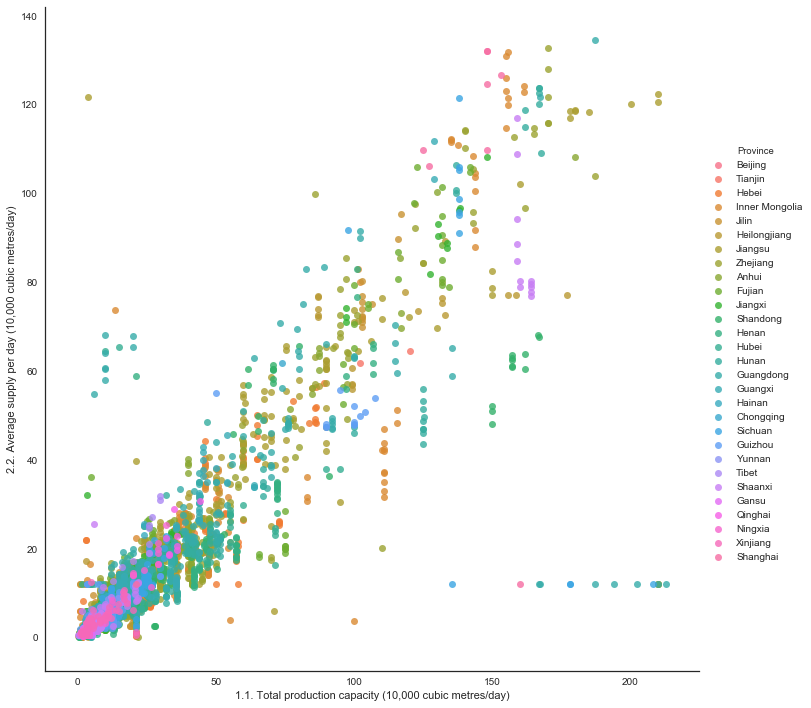

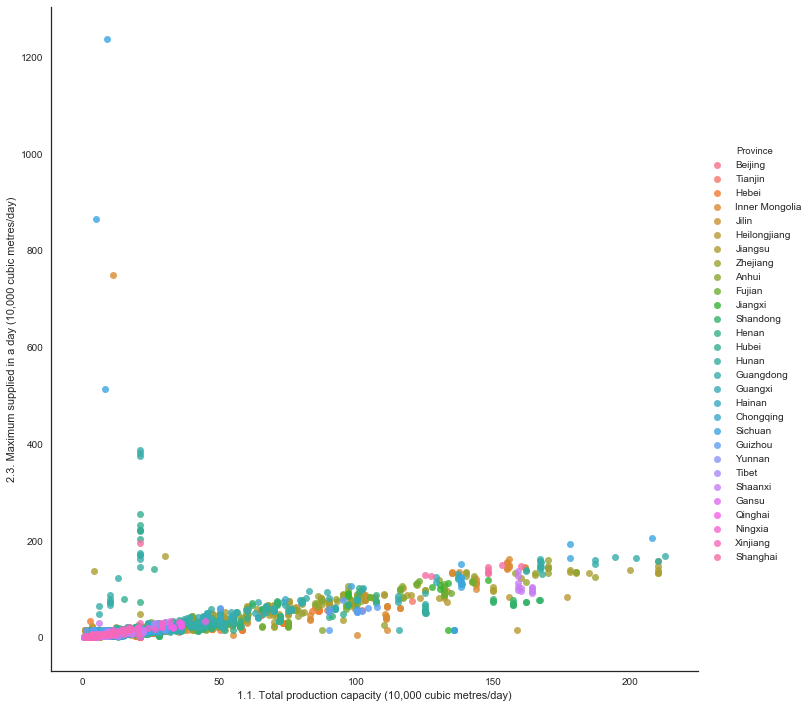

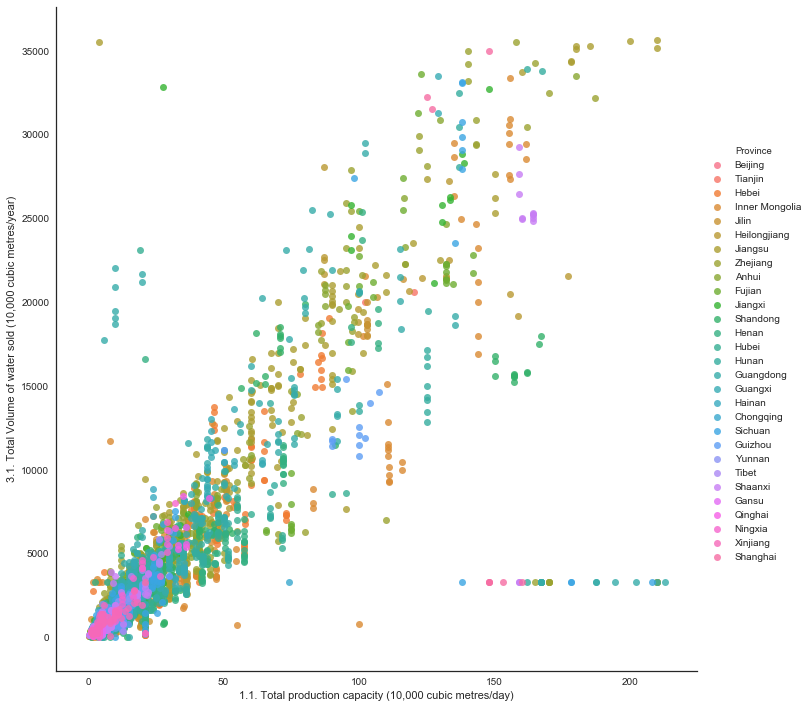

...

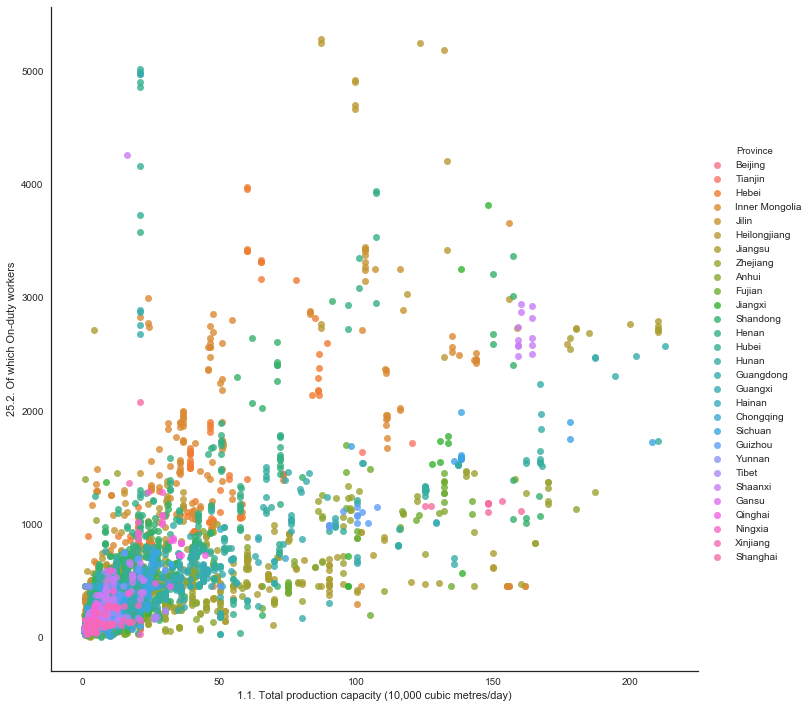

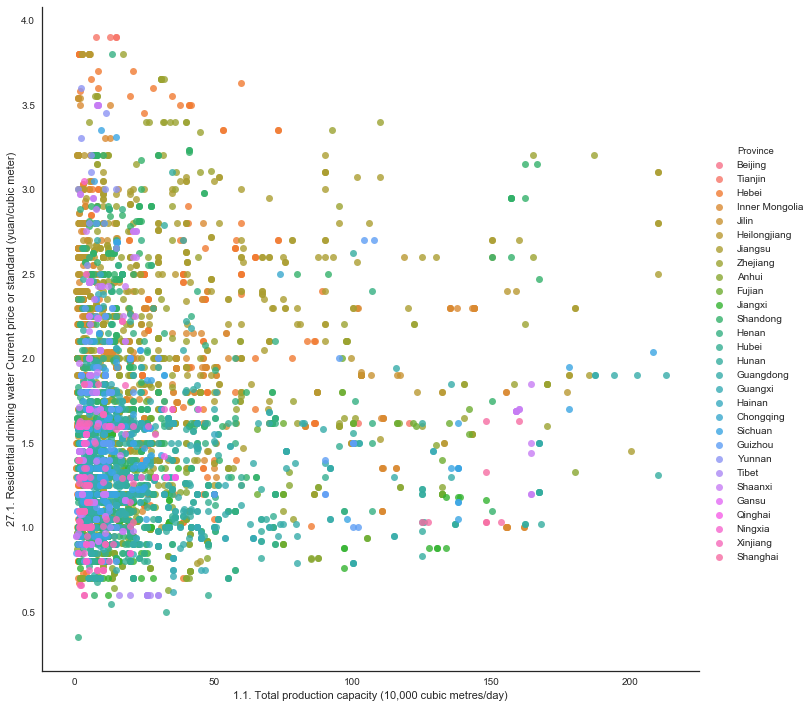

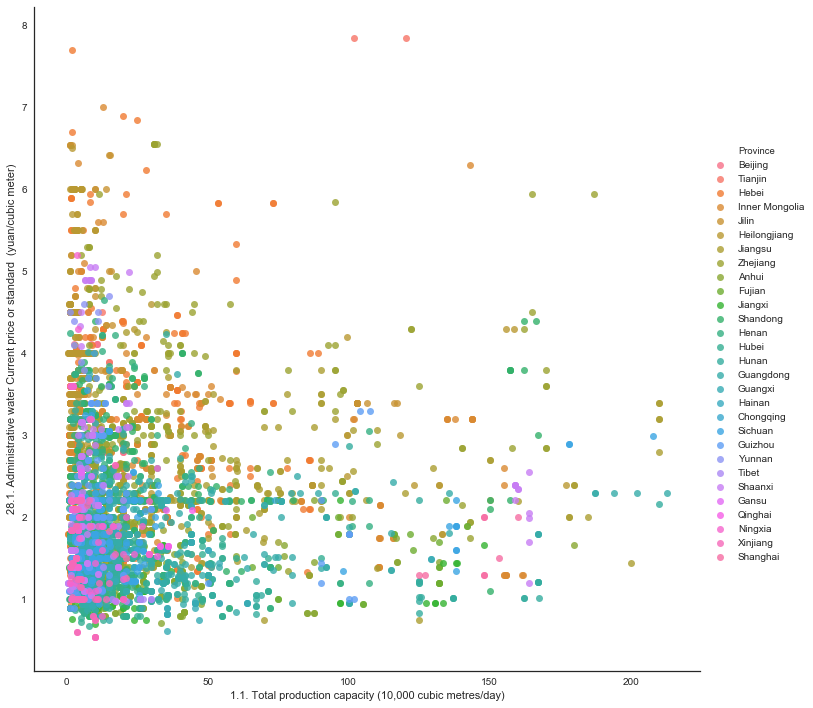

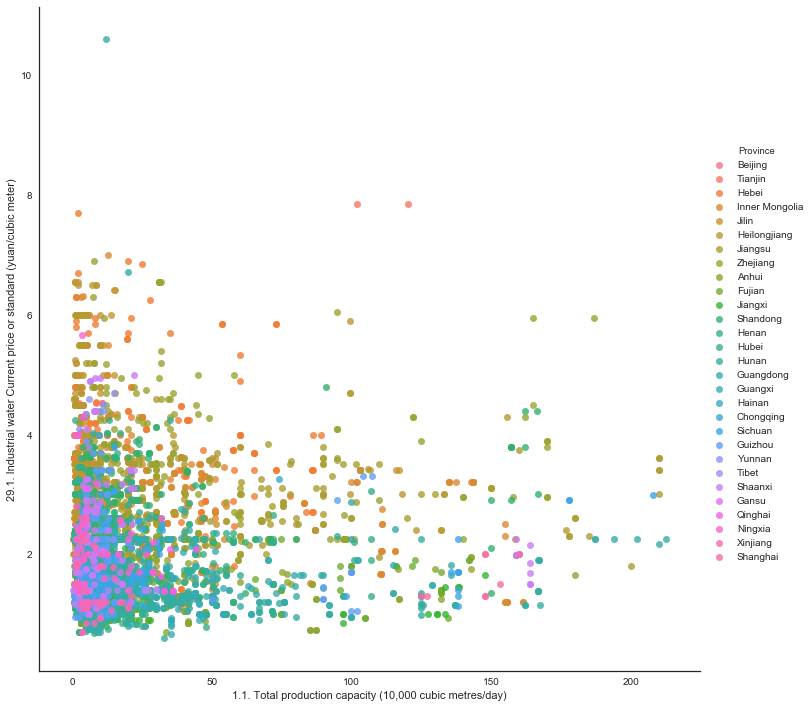

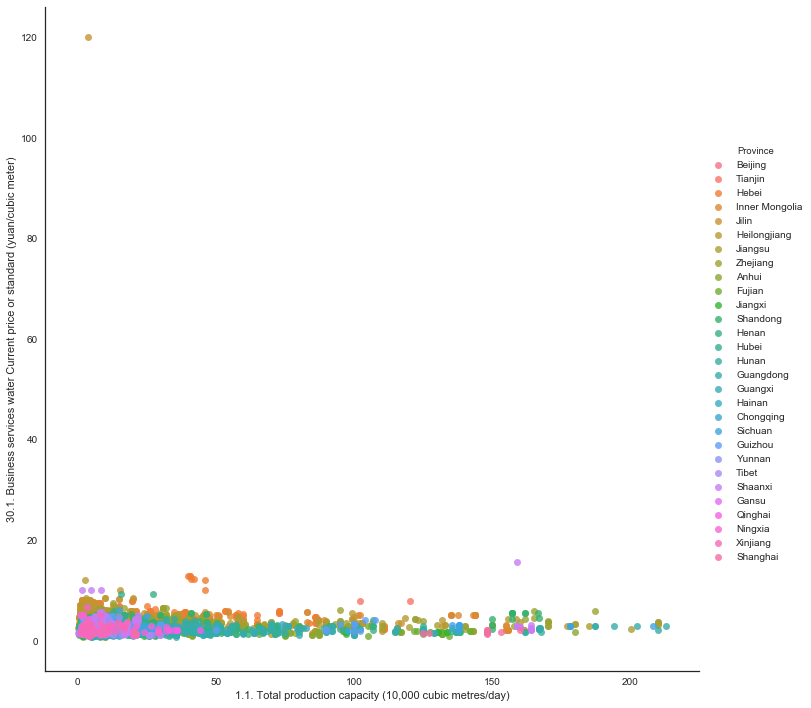

In [29]:
Y = ['1.3. Number of plants (units)',
       '2.1. Total water supply volume / year (10,000 cubic metres/year)',
       '2.2. Average supply per day (10,000 cubic metres/day)',
       '2.3. Maximum supplied in a day (10,000 cubic metres/day)',
       '3.1. Total Volume of water sold (10,000 cubic metres/year)',
       '3.2. Of which Domestic/residential water (10,000 cubic metres/year)',
       '4. Water sold / water produced (%)',
       '5.1. Coverage rate of urban water supply (%)',
       '5.2. Total city population (10,000s)',
       '5.3. Total city population with water access (10,000s)',
       '6.1. Average water use for all purposes (L/person*day)',
       '6.2. Average water use for residential/household/living purposes (L/person*day)',
       '8.1. Total pipe length (km)', '8.3. Of which are supplying water (km)',
       '8.4. of which how much length is for piping 75mm diameter and above (km)',
       '9. Loss and leakage volume (10,000 cubic metres)',
       '10. Loss and leakage rate (%)',
       '13.1. Total number of water meters (units)',
       '13.2. Of which Domestic/residential',
       '14.1. Overall rate of water that meets standard (%)',
       '14.2. turbidity rate meeting standard (%)',
       '14.6. Bacterial contamination rate meeting standards (%)',
       '14.7. Total coliform contamination rate meeting standard (%)',
       '14.8. Oxygen demand (CODMn) meeting standard rate (%)',
       '15.1. Rate at which pressure in water distribution system meets the standard (%)',
       '17.1. Total electricity use (10,000 kWh)',
       '20.1. Original value (10,000 yuan)', '20.2. Net worth (10,000 yuan)',
       '21. Sales revenue (10,000 yuan)',
       '23. Unit water sales cost (yuan / thousand m3)',
       '24. Total wages (10,000 yuan)', '25.1. Total employees (persons)',
       '25.2. Of which On-duty workers',
       '27.1. Residential drinking water Current price or standard (yuan/cubic meter)',
       '28.1. Administrative water Current price or standard  (yuan/cubic meter)',
       '29.1. Industrial water Current price or standard (yuan/cubic meter)',
       '30.1. Business services water Current price or standard (yuan/cubic meter)']
x='1.1. Total production capacity (10,000 cubic metres/day)'
for y in Y:
    sns.lmplot(x,y, data=df_og, hue = 'Province', truncate=True, size=10, fit_reg=False)
    plt.show()

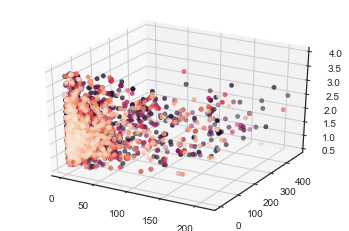

In [53]:
from scipy import stats
from mpl_toolkits.mplot3d import Axes3D 

x=df_og['1.1. Total production capacity (10,000 cubic metres/day)']
y=df_og['5.2. Total city population (10,000s)']
z=df_og['27.1. Residential drinking water Current price or standard (yuan/cubic meter)']

xyz = np.vstack([x,y,z])
density = stats.gaussian_kde(xyz)(xyz) 

idx = density.argsort()
x, y, z, density = x[idx], y[idx], z[idx], density[idx]


fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c=density)
plt.show()

## Using Random Forest to Predict Province

In [31]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

rf = RandomForestClassifier(max_depth=50, n_estimators=20, max_features='log2', random_state=0)
df_og = shuffle(df_og, random_state = 0)
Y=df_og['Province']
X=df_og.drop(['City/province name (CN)', 'City/province name (EN)', 'Province','Year','Province Key', 'Region', 'Region Key'], axis=1)

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.15, random_state=0)

rf.fit(X_train,Y_train)
print('train score: ',rf.score(X_train,Y_train))
print('test score: ', rf.score(X_test,Y_test))

train score:  1.0
test score:  0.780258519389


In [32]:
from sklearn.model_selection import GridSearchCV
parameters = {'n_estimators': [15,20,30,50], 'max_depth':[10,20,50,75,100], 'max_features':['auto', 'sqrt', 'log2']}
gs = GridSearchCV(rf, parameters)
gs.fit(X,Y)
print(gs.best_params_)

C:\Users\Djavi\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:581: Warning:

The least populated class in y has only 2 members, which is too few. The minimum number of groups for any class cannot be less than n_splits=3.



{'max_depth': 50, 'max_features': 'log2', 'n_estimators': 50}


In [33]:
pd.DataFrame(rf.feature_importances_, index=X.columns).sort_values(by=0,ascending=False)

,0
30.1. Business services water Current price or standard (yuan/cubic meter),0.048593
29.1. Industrial water Current price or standard (yuan/cubic meter),0.038938
27.1. Residential drinking water Current price or standard (yuan/cubic meter),0.038490
28.1. Administrative water Current price or standard (yuan/cubic meter),0.032832
25.1. Total employees (persons),0.029699
25.2. Of which On-duty workers,0.028445
13.1. Total number of water meters (units),0.027998
6.1. Average water use for all purposes (L/person*day),0.026831
10. Loss and leakage rate (%),0.026474
6.2. Average water use for residential/household/living purposes (L/person*day),0.025173


# Exploratory Data Analysis - PCA

In [9]:
# Read in data with outliers removed. 
df = pd.read_excel('OutliersRemoved2.xlsx', parse_cols = 'F, H:CM')

c:\users\bchou\appdata\local\programs\python\python36-32\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: the 'parse_cols' keyword is deprecated, use 'usecols' instead
  


In [10]:
#Drop rows and columns with too many NaNs
df = df.dropna(thresh=5000, axis='columns') #Drop columns that have at least 3000 non-NaN values
df = df.dropna(how='any', thresh=40) # Rows/observations should have at least 30 non-NaN values 

#Shape of the refined data
df.shape

(5249, 47)

In [11]:
#Check: how many remaining null values are there for each feature?
df.isnull().sum()

#Show the features with null values as a percent of the total values
df.isnull().sum()/len(df)

# Table below shows acceptable values for missing data (feature with highest missing data is ~14%)
# Imputing NaN values with the mean average of each column is more reliable with less missing data. 

Region Key                                                                          0.000000
1.1. Total production capacity (10,000 cubic metres/day)                            0.004001
1.3. Number of plants (units)                                                       0.019813
2.1. Total water supply volume / year (10,000 cubic metres/year)                    0.003239
2.2. Average supply per day (10,000 cubic metres/day)                               0.005525
2.3. Maximum supplied in a day (10,000 cubic metres/day)                            0.020194
3.1. Total Volume of water sold (10,000 cubic metres/year)                          0.005715
3.2. Of which Domestic/residential water (10,000 cubic metres/year)                 0.011050
3.4. Of which Industrial (10,000 cubic metres/year)                                 0.102496
3.5. Of which Commercial (10,000 cubic metres/year)                                 0.101162
4. Water sold / water produced (%)                                    

In [12]:
# Create a dataframe with the NaN values filled in with the mean of column features
df = df.fillna(df.mean())
df.shape

(5249, 47)

In [13]:
vars = list(df[df.columns[1:]])
vars

['1.1. Total production capacity (10,000 cubic metres/day)',
 '1.3. Number of plants (units)',
 '2.1. Total water supply volume / year (10,000 cubic metres/year)',
 '2.2. Average supply per day (10,000 cubic metres/day)',
 '2.3. Maximum supplied in a day (10,000 cubic metres/day)',
 '3.1. Total Volume of water sold (10,000 cubic metres/year)',
 '3.2. Of which Domestic/residential water (10,000 cubic metres/year)',
 '3.4. Of which Industrial (10,000 cubic metres/year)',
 '3.5. Of which Commercial (10,000 cubic metres/year)',
 '4. Water sold / water produced (%)',
 '5.1. Coverage rate of urban water supply (%)',
 '5.2. Total city population (10,000s)',
 '5.3. Total city population with water access (10,000s)',
 '6.1. Average water use for all purposes (L/person*day)',
 '6.2. Average water use for residential/household/living purposes (L/person*day)',
 '8.1. Total pipe length (km)',
 '8.3. Of which are supplying water (km)',
 '8.4. of which how much length is for piping 75mm diameter and 

In [14]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(df[vars])
scaled_data = scaler.transform(df[vars])

In [15]:
from sklearn.decomposition import PCA
pca = PCA(n_components=5)
pca.fit(scaled_data)
x_pca = pca.transform(scaled_data)

Text(0,0.5,'Second Principal Component')

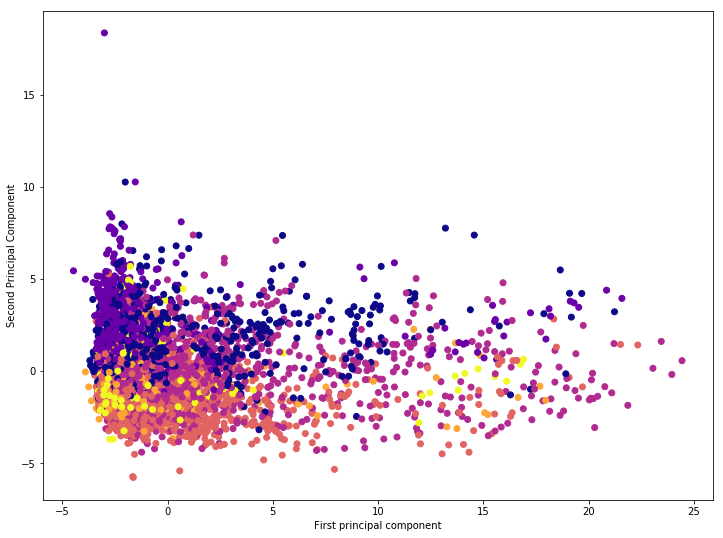

In [16]:
plt.figure(figsize=(12,9))
plt.scatter(x_pca[:,0],x_pca[:,1],c=df['Region Key'], cmap='plasma')
plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')

In [17]:
pca.components_

array([[ 0.22544644,  0.14361146,  0.22541963,  0.22788498,  0.15892371,
         0.21970885,  0.20326413,  0.18567213,  0.18302539,  0.0197849 ,
         0.04850246,  0.21280922,  0.20952883,  0.10326848,  0.08516911,
         0.2056469 ,  0.20136887,  0.20334348,  0.20227544, -0.04043456,
         0.1867328 ,  0.18222389,  0.02147138,  0.00607683,  0.03123018,
         0.02874514,  0.03281753,  0.02093209, -0.01979999,  0.12702029,
        -0.00655717,  0.06505934, -0.00492578,  0.21268151,  0.20269069,
         0.21212896, -0.00310631,  0.20315247,  0.18142303,  0.18444902,
         0.18094273,  0.03169746,  0.01367858,  0.01445022,  0.00180792,
        -0.00194461],
       [-0.03420955,  0.04067722, -0.04241689, -0.04044703, -0.03519547,
        -0.04889704, -0.06022779, -0.03226068, -0.0590659 , -0.09163202,
        -0.07732729,  0.0254041 ,  0.01117629, -0.21660384, -0.23514589,
         0.03240654,  0.02556767,  0.02811944, -0.02554346,  0.11472812,
         0.06936993,  0.07262

In [18]:
df_comp = pd.DataFrame(pca.components_,columns=list(df[vars].columns.values))

In [19]:
df_comp

,"1.1. Total production capacity (10,000 cubic metres/day)",1.3. Number of plants (units),"2.1. Total water supply volume / year (10,000 cubic metres/year)","2.2. Average supply per day (10,000 cubic metres/day)","2.3. Maximum supplied in a day (10,000 cubic metres/day)","3.1. Total Volume of water sold (10,000 cubic metres/year)","3.2. Of which Domestic/residential water (10,000 cubic metres/year)","3.4. Of which Industrial (10,000 cubic metres/year)","3.5. Of which Commercial (10,000 cubic metres/year)",4. Water sold / water produced (%),...,23. Unit water sales cost (yuan / thousand m3),"24. Total wages (10,000 yuan)",25.1. Total employees (persons),25.2. Of which On-duty workers,25.4. Of which professional and technical personnel,27.1. Residential drinking water Current price or standard (yuan/cubic meter),28.1. Administrative water Current price or standard (yuan/cubic meter),29.1. Industrial water Current price or standard (yuan/cubic meter),30.1. Business services water Current price or standard (yuan/cubic meter),32.1. Unit average water Current price or standard (yuan/cubic meter)
0,0.225446,0.143611,0.225420,0.227885,0.158924,0.219709,0.203264,0.185672,0.183025,0.019785,...,-0.003106,0.203152,0.181423,0.184449,0.180943,0.031697,0.013679,0.014450,0.001808,-0.001945
1,-0.034210,0.040677,-0.042417,-0.040447,-0.035195,-0.048897,-0.060228,-0.032261,-0.059066,-0.091632,...,0.324552,0.058624,0.058031,0.054958,0.013613,0.382596,0.424852,0.424559,0.295473,0.339067
2,0.021868,0.084676,0.017571,0.019185,0.025301,0.004870,0.003248,-0.019521,-0.022680,-0.047449,...,0.006669,0.019347,0.151355,0.149635,0.081412,-0.134027,-0.091047,-0.083910,-0.040438,-0.030034
3,-0.007153,-0.153271,0.035982,0.039425,0.021329,0.057978,0.015565,0.088807,0.077028,0.126298,...,-0.031990,-0.069191,-0.274942,-0.272143,-0.187896,0.205483,0.162693,0.157941,0.063411,0.082297
4,-0.004957,-0.029640,0.003673,0.002182,-0.008270,0.011643,-0.025266,0.035073,-0.004201,0.076712,...,0.015047,-0.047593,-0.048728,-0.048366,-0.055835,0.021542,0.015278,0.017863,0.003080,0.020058


In [20]:
df_comp = df_comp.set_index([['C1','C2','C3','C4','C5']])
df_comp

,"1.1. Total production capacity (10,000 cubic metres/day)",1.3. Number of plants (units),"2.1. Total water supply volume / year (10,000 cubic metres/year)","2.2. Average supply per day (10,000 cubic metres/day)","2.3. Maximum supplied in a day (10,000 cubic metres/day)","3.1. Total Volume of water sold (10,000 cubic metres/year)","3.2. Of which Domestic/residential water (10,000 cubic metres/year)","3.4. Of which Industrial (10,000 cubic metres/year)","3.5. Of which Commercial (10,000 cubic metres/year)",4. Water sold / water produced (%),...,23. Unit water sales cost (yuan / thousand m3),"24. Total wages (10,000 yuan)",25.1. Total employees (persons),25.2. Of which On-duty workers,25.4. Of which professional and technical personnel,27.1. Residential drinking water Current price or standard (yuan/cubic meter),28.1. Administrative water Current price or standard (yuan/cubic meter),29.1. Industrial water Current price or standard (yuan/cubic meter),30.1. Business services water Current price or standard (yuan/cubic meter),32.1. Unit average water Current price or standard (yuan/cubic meter)
C1,0.225446,0.143611,0.225420,0.227885,0.158924,0.219709,0.203264,0.185672,0.183025,0.019785,...,-0.003106,0.203152,0.181423,0.184449,0.180943,0.031697,0.013679,0.014450,0.001808,-0.001945
C2,-0.034210,0.040677,-0.042417,-0.040447,-0.035195,-0.048897,-0.060228,-0.032261,-0.059066,-0.091632,...,0.324552,0.058624,0.058031,0.054958,0.013613,0.382596,0.424852,0.424559,0.295473,0.339067
C3,0.021868,0.084676,0.017571,0.019185,0.025301,0.004870,0.003248,-0.019521,-0.022680,-0.047449,...,0.006669,0.019347,0.151355,0.149635,0.081412,-0.134027,-0.091047,-0.083910,-0.040438,-0.030034
C4,-0.007153,-0.153271,0.035982,0.039425,0.021329,0.057978,0.015565,0.088807,0.077028,0.126298,...,-0.031990,-0.069191,-0.274942,-0.272143,-0.187896,0.205483,0.162693,0.157941,0.063411,0.082297
C5,-0.004957,-0.029640,0.003673,0.002182,-0.008270,0.011643,-0.025266,0.035073,-0.004201,0.076712,...,0.015047,-0.047593,-0.048728,-0.048366,-0.055835,0.021542,0.015278,0.017863,0.003080,0.020058


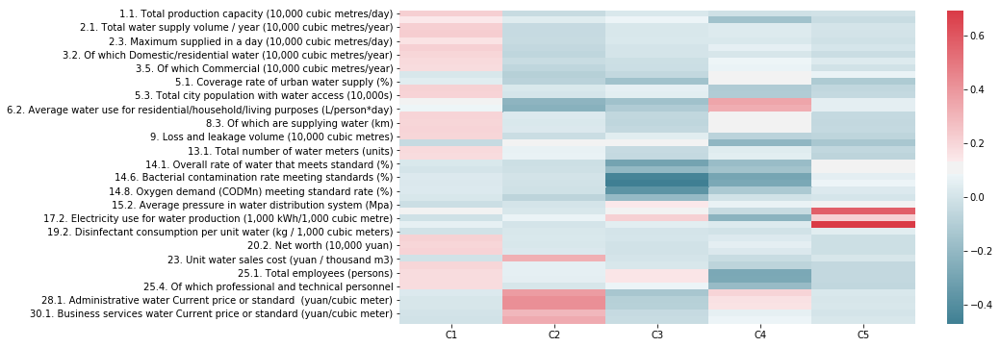

In [21]:
plt.figure(figsize=(12,6))
sns.heatmap(df_comp.T,cmap = sns.diverging_palette(220, 10, as_cmap=True))

In [47]:
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)
print(pca.explained_variance_ratio_.cumsum())

[ 17.13955921   4.37233876   2.08046944   1.65168611   1.36449579]
[ 0.37259911  0.09505084  0.0452276   0.03590622  0.02966295]
[ 0.37259911  0.46764996  0.51287755  0.54878377  0.57844672]


In [48]:
Hist1 = df_comp.iloc[0,:]
pd.DataFrame(Hist1)

,C1
"1.1. Total production capacity (10,000 cubic metres/day)",0.225446
1.3. Number of plants (units),0.143611
"2.1. Total water supply volume / year (10,000 cubic metres/year)",0.225420
"2.2. Average supply per day (10,000 cubic metres/day)",0.227885
"2.3. Maximum supplied in a day (10,000 cubic metres/day)",0.158924
"3.1. Total Volume of water sold (10,000 cubic metres/year)",0.219709
"3.2. Of which Domestic/residential water (10,000 cubic metres/year)",0.203264
"3.4. Of which Industrial (10,000 cubic metres/year)",0.185672
"3.5. Of which Commercial (10,000 cubic metres/year)",0.183025
4. Water sold / water produced (%),0.019785


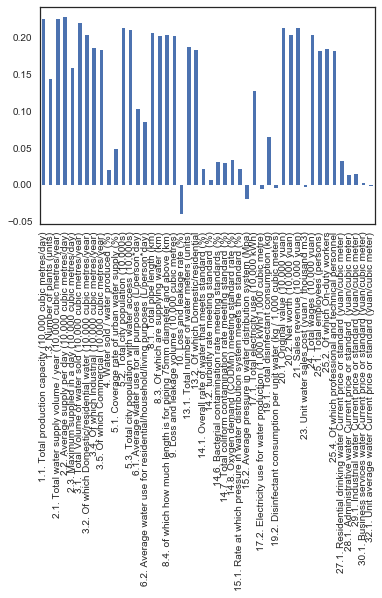

In [49]:
Hist1.plot(kind='bar')

In [50]:
Hist2 = df_comp.iloc[1,:]
pd.DataFrame(Hist2)

,C2
"1.1. Total production capacity (10,000 cubic metres/day)",-0.034217
1.3. Number of plants (units),0.040680
"2.1. Total water supply volume / year (10,000 cubic metres/year)",-0.042430
"2.2. Average supply per day (10,000 cubic metres/day)",-0.040461
"2.3. Maximum supplied in a day (10,000 cubic metres/day)",-0.035223
"3.1. Total Volume of water sold (10,000 cubic metres/year)",-0.048910
"3.2. Of which Domestic/residential water (10,000 cubic metres/year)",-0.060240
"3.4. Of which Industrial (10,000 cubic metres/year)",-0.032270
"3.5. Of which Commercial (10,000 cubic metres/year)",-0.059080
4. Water sold / water produced (%),-0.091642


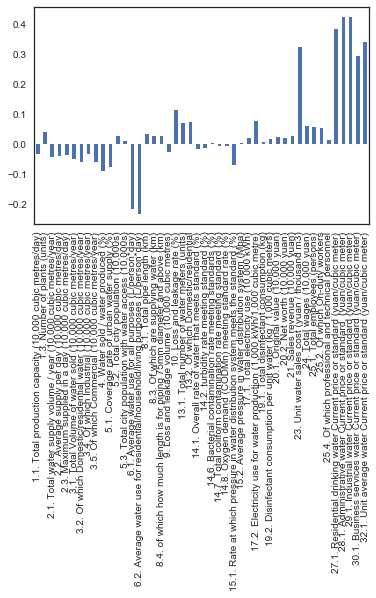

In [51]:
Hist2.plot(kind='bar')